## Mira Attractor
Still in progress...

\begin{equation}
f(x) = a x + \frac{2(1- a) x^2}{ (1 + x^2)}
\end{equation}
http://mathworld.wolfram.com/MiraFractal.html

Using that equation, we can iterate the following formulas to calculate sequential $x$,$y$ location

\begin{equation}
x_{n + 1} = b y _{n} + f(x_n),\quad y_{n +1} = f(x_{n + 1})  - x_{n}
\end{equation}

### Plotting options 

In [1]:
import numpy as np, pandas as pd, datashader as ds
from datashader import transfer_functions as tf
from datashader.colors import inferno, viridis
from numba import jit
import numba
from functools import partial
from datashader.utils import export_image
background = "white"
import sys
ds.transfer_functions.Image.border = 0

For saving figures we use `partial` and `export_image`. 

In [2]:
img_map = partial(export_image, export_path="Gmira_maps", background=background)

### Mira

In [3]:
@jit
def f(x, a):
    return a * x + 2 * (1 - a) * x**2 / (1.0 + x**2)
@jit
def mira_map(x, y, a, b):
    xn = b * y + f(x, a)
    yn = -x + f(xn, a)
    return xn, yn

### Let's see Mira 

In [4]:
n = 20000000
@jit
def trajectorym(a=0.2, b=1, x0=12, y0=0, n=n):
    x, y = np.zeros(n), np.zeros(n)
    x[0], y[0] = x0, y0
    for i in np.arange(n-1):
        x[i+1], y[i+1] = mira_map(x[i], y[i], a, b)
    return pd.DataFrame(dict(x=x,y=y))

In [5]:
df = trajectorym(a = .2, b = 1, x0 = 12, y0 = 0)

In [6]:
df.head()

,x,y
0,12.000000,0.000000
1,3.988966,-9.696815
2,-7.393630,-3.896435
3,-3.803904,8.129421
4,8.865213,7.156844


#### Colors

Now, a set of suitable colormaps can be found in `colorcet` as follows.

In [7]:
from colorcet import palette
cmaps =  [palette[p] for p in ['bgy', 'bmw', 'bgyw', 'bmy','fire', 'gray', 'kbc', 'kgy']]
cmaps += [inferno[::-1], viridis[::-1]]

In [8]:
cvs = ds.Canvas(plot_width = 600, plot_height = 600)
agg = cvs.points(df, 'x', 'y')
img = tf.shade(agg, cmap = cmaps[4])

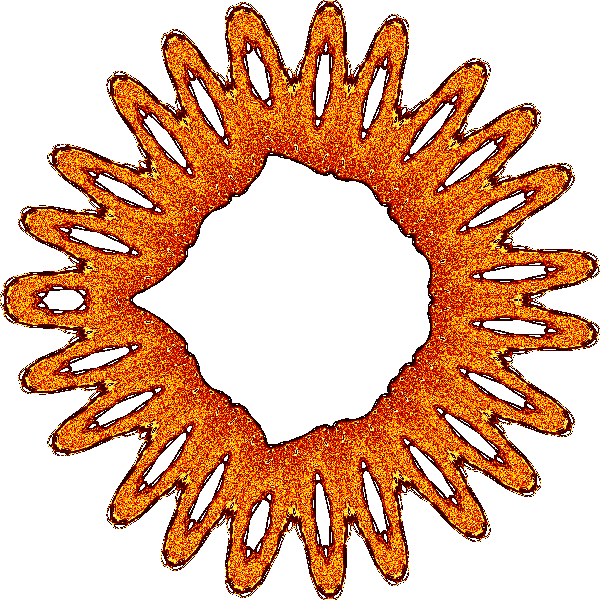

In [9]:
tf.dynspread(img)

See http://holoviews.org/user_guide/Colormaps.html for more info. 

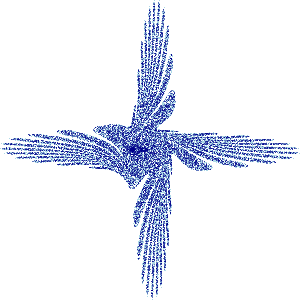

In [10]:
n = 100000
df = trajectorym(a = 0.008, b = .99, x0 = .5, y0 = 0.3)
cvs = ds.Canvas(plot_width = 300, plot_height = 300)
#agg = cvs.line(df, 'x', 'y')
agg = cvs.points(df, 'x', 'y')
img = tf.shade(agg)
tf.dynspread(img)

In [11]:
df = trajectorym(a = 0.002, b = .9998, x0 = .1, y0 = 0.1)
cvs = ds.Canvas(plot_width = 300, plot_height = 300)
#agg = cvs.line(df, 'x', 'y')
agg = cvs.points(df, 'x', 'y')

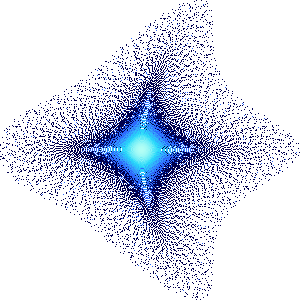

In [12]:
img = tf.shade(agg, cmap = cmaps[6])
tf.dynspread(img)

In [13]:
wb = ["white", "black"]

In [14]:
def plotM(mira_map, a = .2, b = 1, x0 = 12, y0 = 0, n=n, cmap=wb):
    df = trajectorym(a, b, x0, y0)
    cvs = ds.Canvas(plot_width = 600, plot_height = 600)
    agg = cvs.points(df, 'x', 'y')
    img = tf.shade(agg, cmap=cmap)
    return img

The following values are from http://mathworld.wolfram.com/MiraFractal.html

In [15]:
cvals = [
     (-.77, .95, .6, .1),
     (.31, 1, .6, .1),
    (-.23, 1, 6, .1),
    (.2, 1, 12, 0),
    (.4, 1, 6, 4),
    (.7, 0.9998, 9,0),
    (.7,.9998, 12.1,0),
    (.7, .9998, 15, 0),
]

In [16]:
miraSet = [plotM(mira_map, *cvals[i], cmap=cmaps[i%len(cmaps)])
           for i in range(len(cvals))]

,,,
,,,

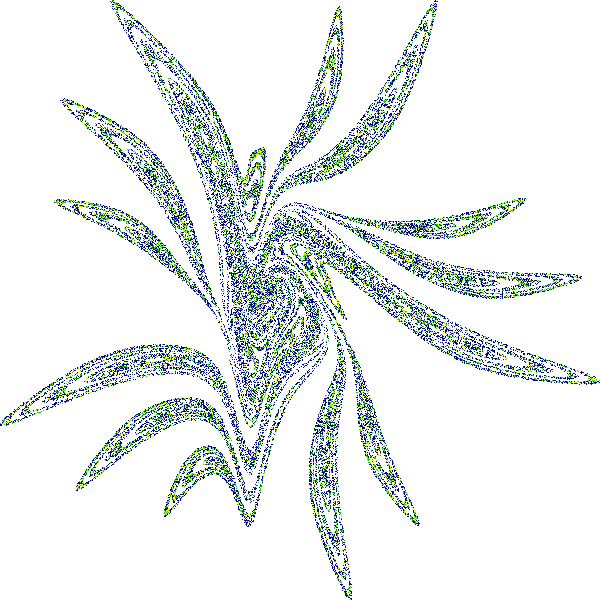
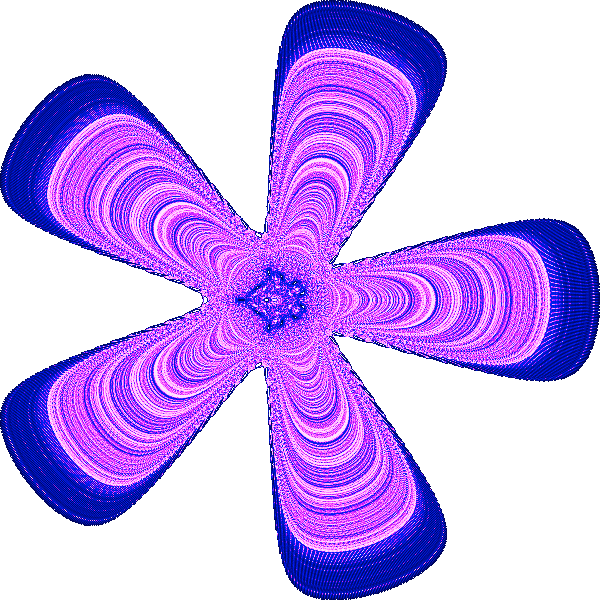
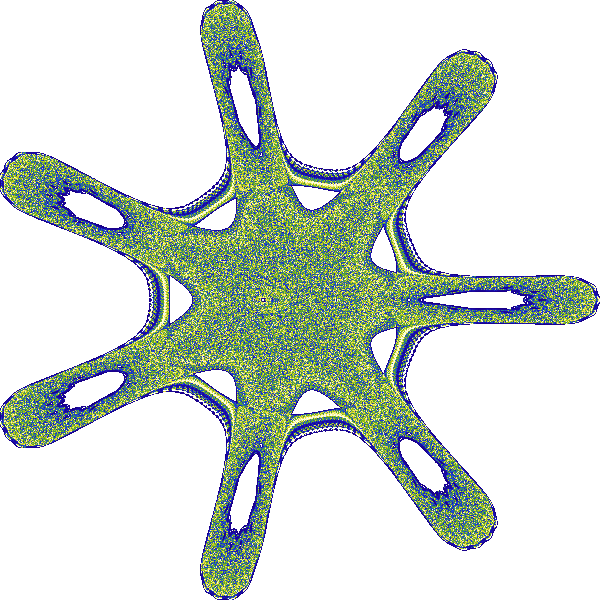
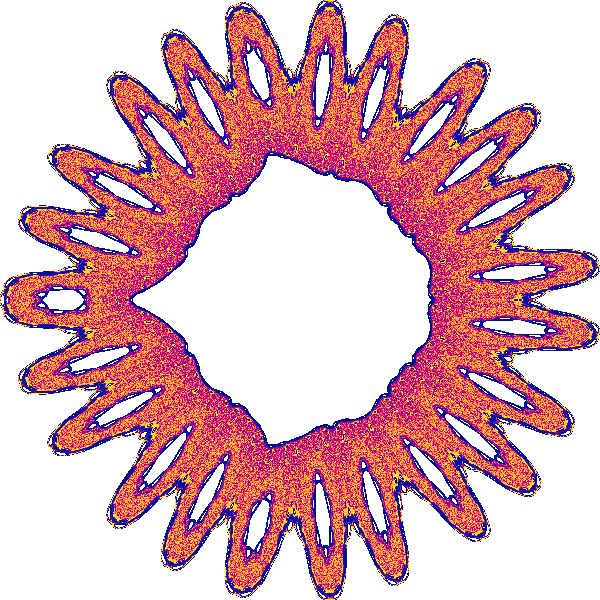
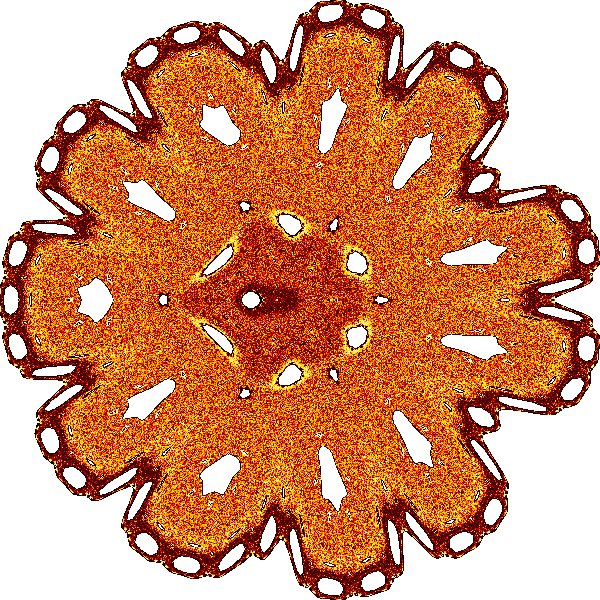
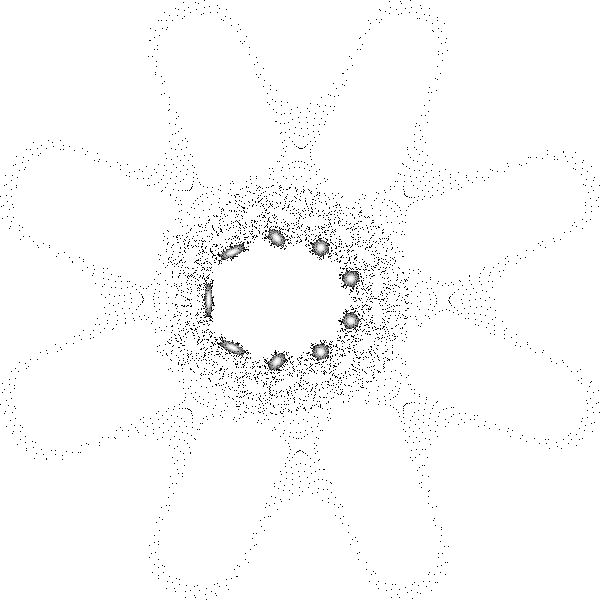
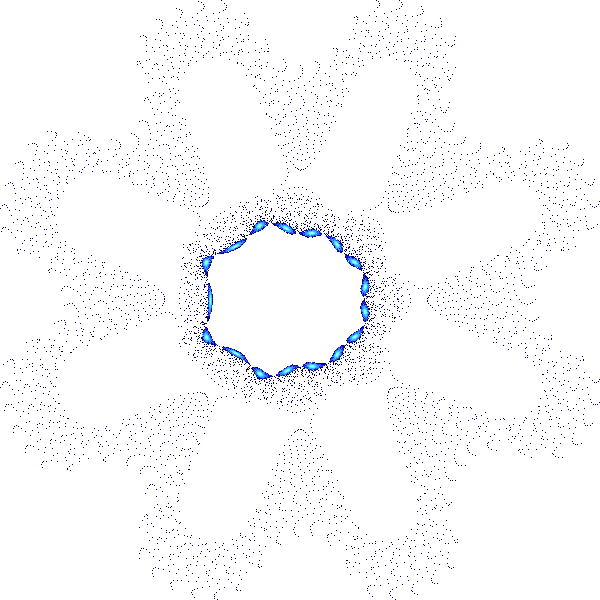
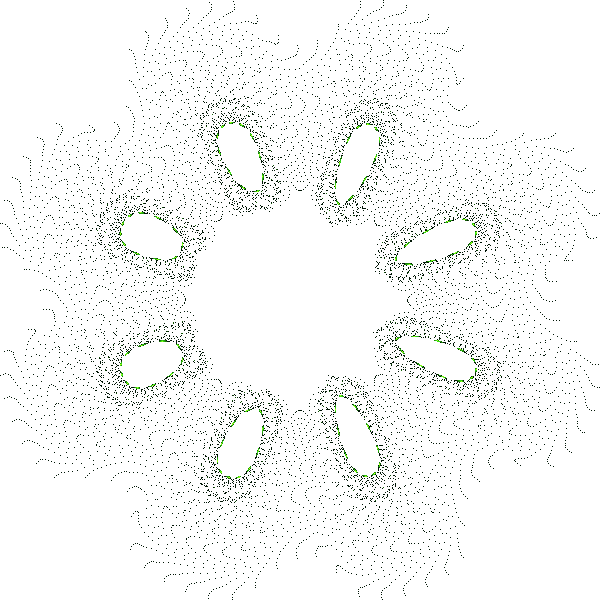

In [17]:
tf.Images(*miraSet).cols(4)

### Now Gumowski-Mira
http://www.scipress.org/journals/forma/pdf/2102/21020151.pdf

The Gumowski-Mira equation was developed in 1980 at CERN by I. Gumowski and C. Mira to calculate the trajectories of sub-atomic particles. The main equation is as follows:

http://kgdawiec.bplaced.net/badania/pdf/cacs_2010.pdf

http://shodhganga.inflibnet.ac.in/bitstream/10603/22501/11/11_chapter3.pdf

\begin{equation}
G(x, \mu) = \mu x + \frac{2(1- \mu) x^2}{ (1 + x^2)}
\end{equation}

\begin{equation}
x_{n + 1} = y _{n} + a (1 - by_{n}^2)y_{n} + G(x_n),\quad y_{n +1} = G(x_{n + 1}, \mu)  - x_{n}
\end{equation}

In [18]:
@jit
def g(x, μ):
    return μ * x + 2 * (1 - μ) * x**2 / (1.0 + x**2)
@jit
def Gmira_map(x, y, a, b, μ):
    xn = y + a*(1 - b*y**2)*y  +  g(x, μ)
    yn = -x + g(xn, μ)
    return xn, yn

In [19]:
n = 10000000
@jit
def trajectoryGm(a, b, μ , x0=.1, y0=0.1, n=n):
    x, y = np.zeros(n), np.zeros(n)
    x[0], y[0] = x0, y0
    for i in np.arange(n-1):
        x[i+1], y[i+1] = Gmira_map(x[i], y[i], a, b, μ)
    return pd.DataFrame(dict(x=x,y=y))

In [20]:
cvals = [
    (.008, .05, .9, 0.1, 0.1),
    (.0, .5, -.75, 0.1, 0.1),
    (.0, .5, -.7509, 0.1, 0.1),
    (.0, .5, -.65, 0.1, 0.1),
    (.0, .5, -.115, 4, 1),
    (.0, .5, -.32, 4, 1),
    (.0, .5, -.22, 0, 1),
    (.008, .05, -.9, 0, 1),
    (.008, .05, -.45, 0, 1),
    (.008, .05, -.495, 0, 1),    
    (.008, .05, .16, .1, .1),    
]

In [21]:
def plotGmira(Gmira_map, a = .2, b = 1, μ = -.9, x0 = 12, y0 = 0, n=n, cmap=wb):
    df = trajectoryGm(a, b, μ, x0, y0)
    cvs = ds.Canvas(plot_width = 600, plot_height = 600)
    agg = cvs.points(df, 'x', 'y')
    img = tf.shade(agg, cmap=cmap)
    return img

In [22]:
cmaps =  [palette[p][::-1] for p in ['bgy', 'bmw', 'bgyw', 'bmy','fire', 'gray', 'kbc', 'kgy']]
cmaps += [inferno[::-1], viridis[::-1]]

In [23]:
gmSet = [plotGmira(Gmira_map, *cvals[i], cmap=cmaps[(i+1)%len(cmaps)])
           for i in range(len(cvals))]


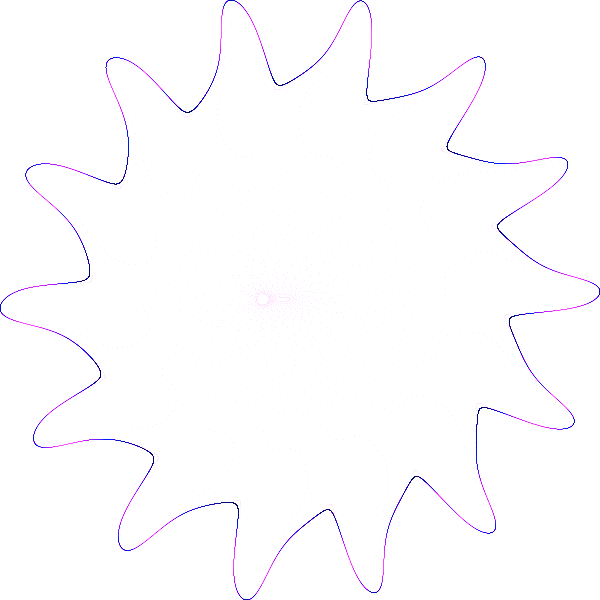
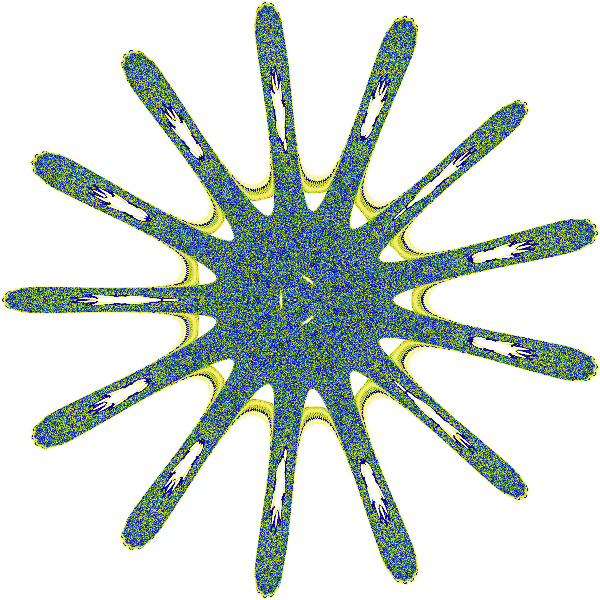
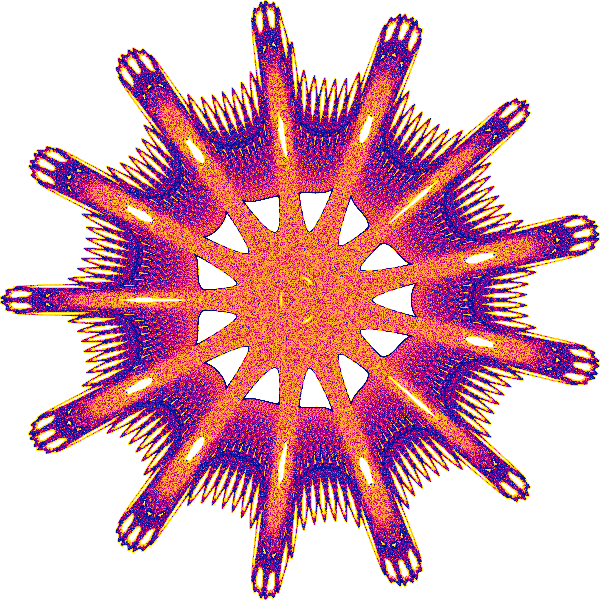
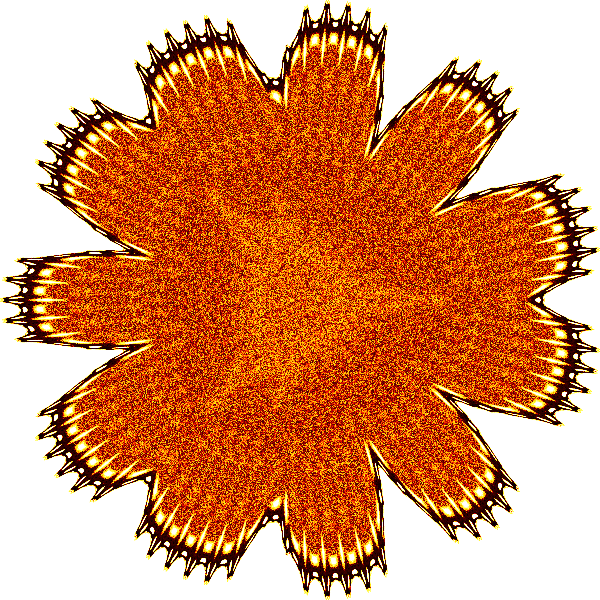
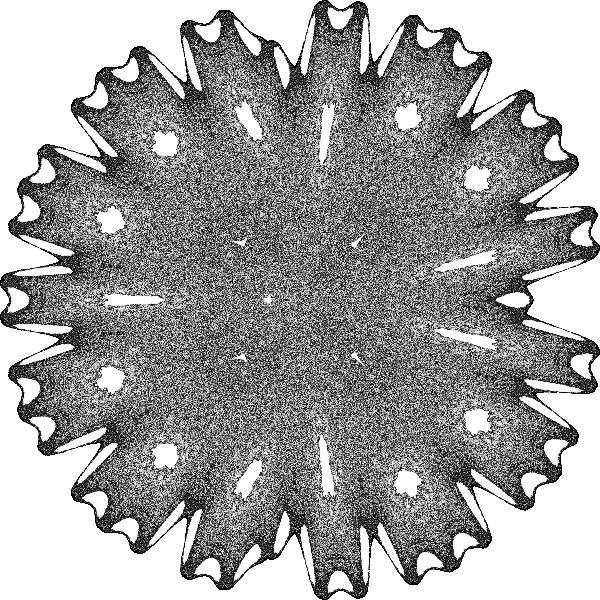
...
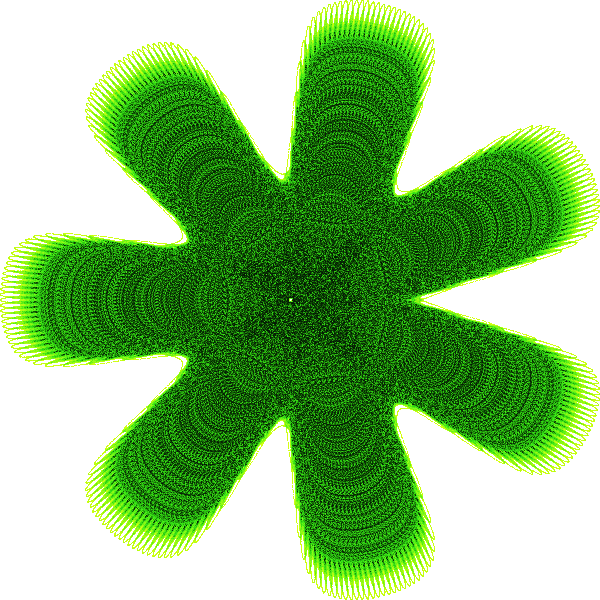
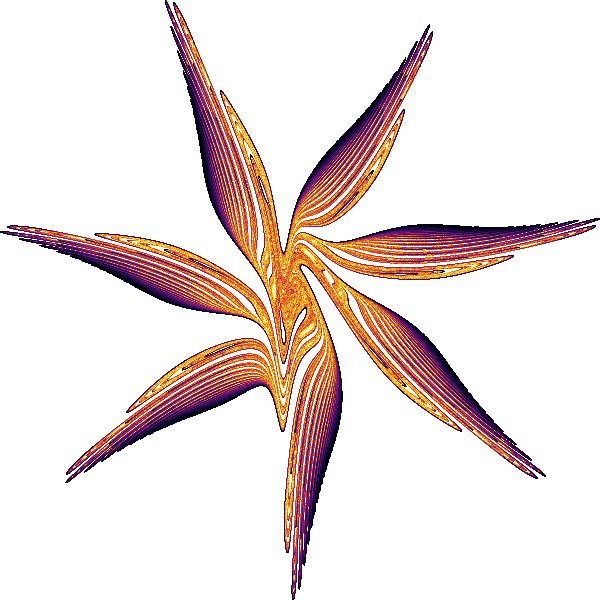
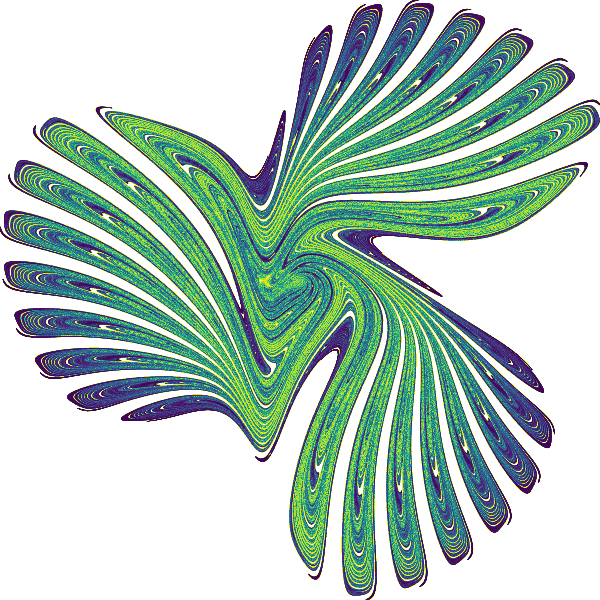
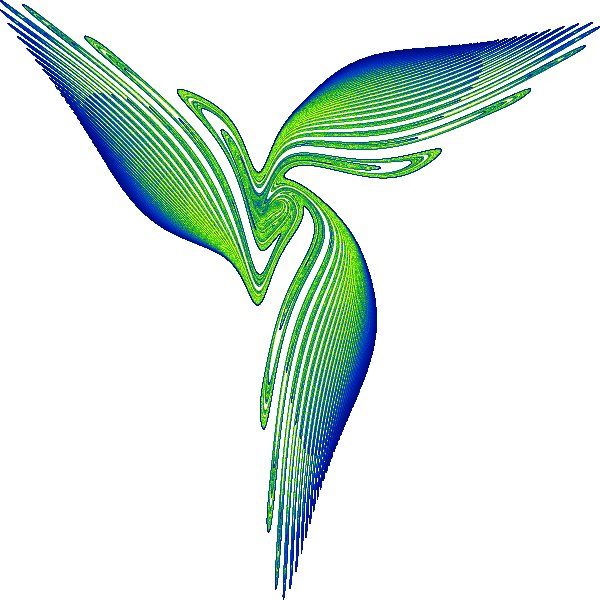
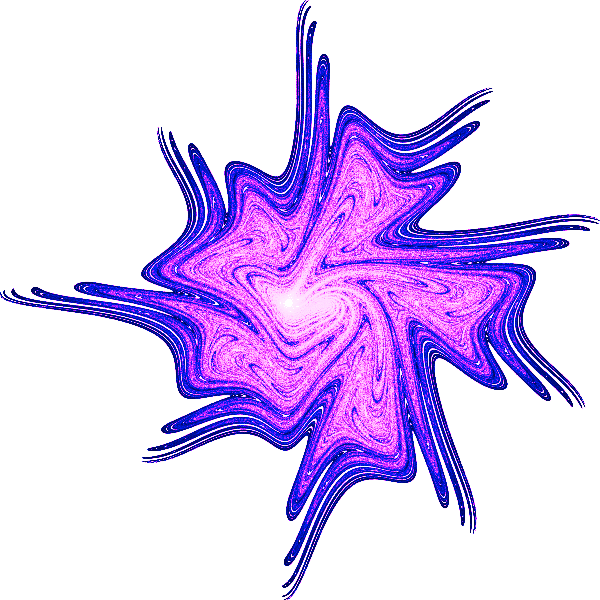

In [24]:
tf.Images(*gmSet).cols(4)

http://www.scipress.org/journals/forma/pdf/1502/15020121.pdf

In [25]:
cvals = [(.008, .5, μ, 0.1,0.1) for μ in np.arange(-1,1, .1)]

In [26]:
from colorcet import palette
cmaps =  [palette[p] for p in ['bgy', 'bmw', 'bgyw', 'bmy','fire', 'gray', 'kbc', 'kgy']]
cmaps += [inferno[::-1], viridis[::-1]]

In [27]:
def plotGmira(Gmira_map, a = .2, b = 1, μ = -.9, x0 = 12, y0 = 0, n=n, cmap=wb):
    df = trajectoryGm(a, b, μ, x0, y0)
    cvs = ds.Canvas(plot_width = 100, plot_height = 100)
    agg = cvs.points(df, 'x', 'y')
    img = tf.shade(agg, cmap=cmap)
    return img

In [28]:
n = 50000000
gmSet2 = [plotGmira(Gmira_map, *cvals[i], cmap=cmaps[6])
           for i in range(len(cvals))]

,,,,,,,,,
,,,,,,,,,

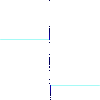
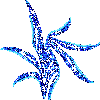
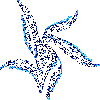
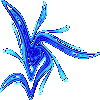
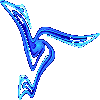
...
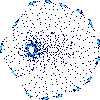
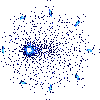
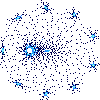
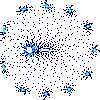
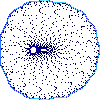

In [29]:
tf.Images(*gmSet2).cols(10)

### Selection 
living marine creatures

In [30]:
cvals = [
    (.0, .5, -.75, 0.1, 0.1),
    (.008, .05, -.496, 0, 1),
    (.0, .5, -.7509, 0.1, 0.1),
    (.0, .5, -.22, 0, 1),
    (.008, .05, -.9, 0, 1),
    (.008, .05, -.45, 0, 1),
    (.008, .05, .16, .1, .1),
    (.008, .05, -.7, 0, .5),
    (.0, .05, -.2, 0.5, 0),
    (.0, .05, -.22, 0.5, .5),
    (.0, .05, -.31, 0, .5),
    (.0, .05, -.55, 0, .5),
    (.0, .05, -.23, 0.5, .5),
    (.009, .05, np.cos(2*np.pi/5) + 0.008, 0.5, .5),
    (.0, .5, -.65, 0.1, 0.1),
]

In [31]:
cmaps =  [palette[p][::-1] for p in ['bgy', 'bmw', 'bgyw', 'bmy','fire', 'kbc', 'kgy']]
cmaps += [inferno[::-1], viridis[::-1]]

In [32]:
def plotGmira(Gmira_map, a = .2, b = 1, μ = -.9, x0 = 12, y0 = 0, n=n, cmap=wb):
    df = trajectoryGm(a, b, μ, x0, y0)
    cvs = ds.Canvas(plot_width = 600, plot_height = 600)
    agg = cvs.points(df, 'x', 'y')
    img = tf.shade(agg, cmap=cmap)
    return img

In [43]:
n = 50000000
gmSet3 = [plotGmira(Gmira_map, *cvals[i], cmap=cmaps[(i)%len(cmaps)])
           for i in range(len(cvals))]

,,,,
,,,,
,,,,

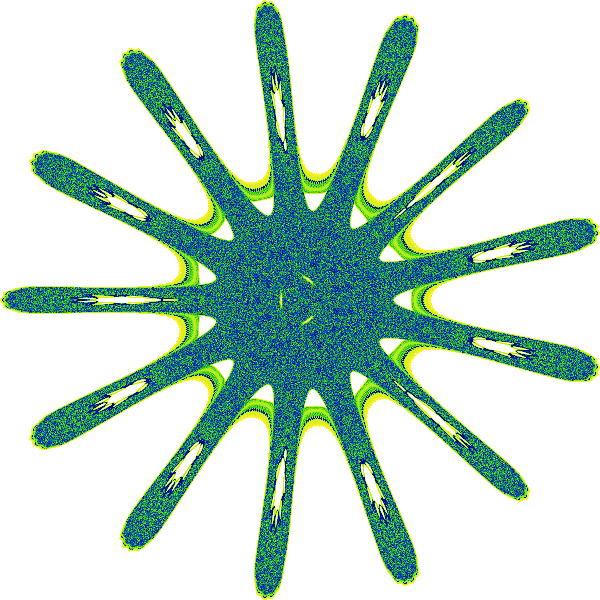
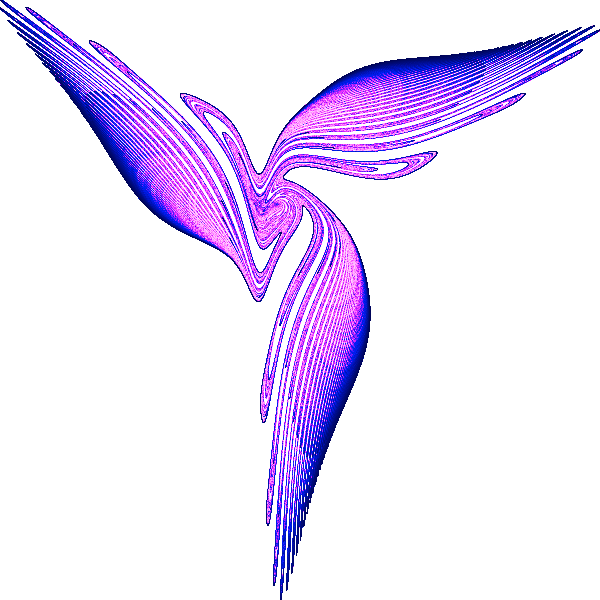
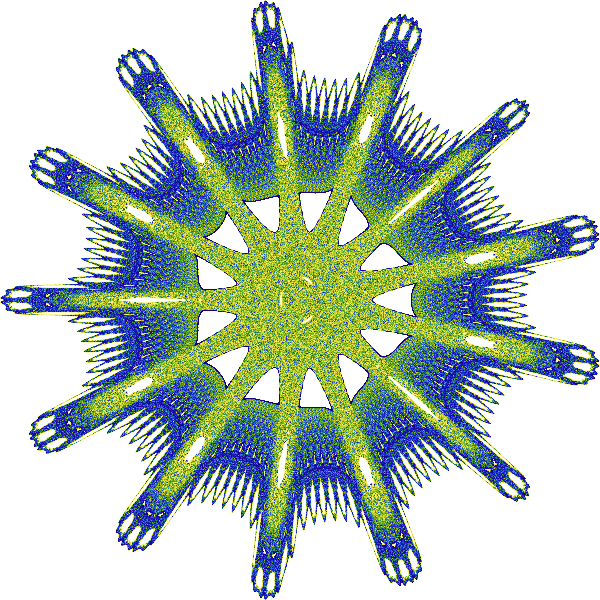
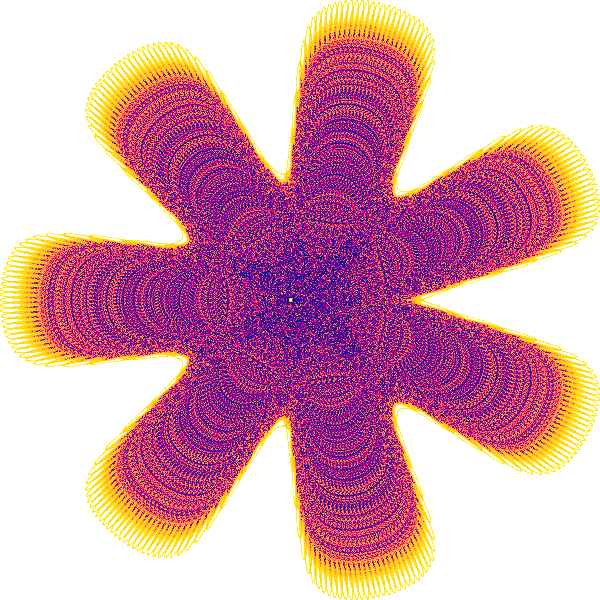
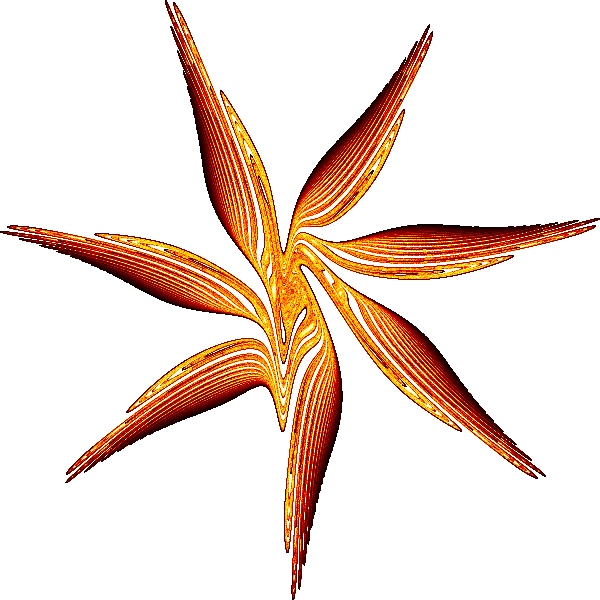
...
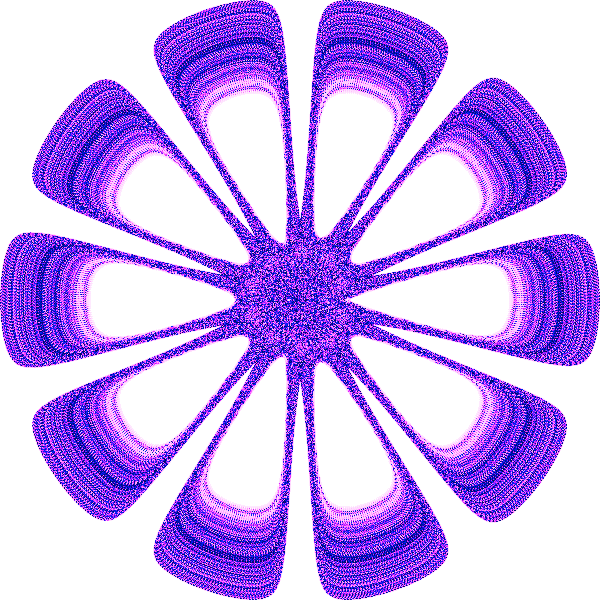
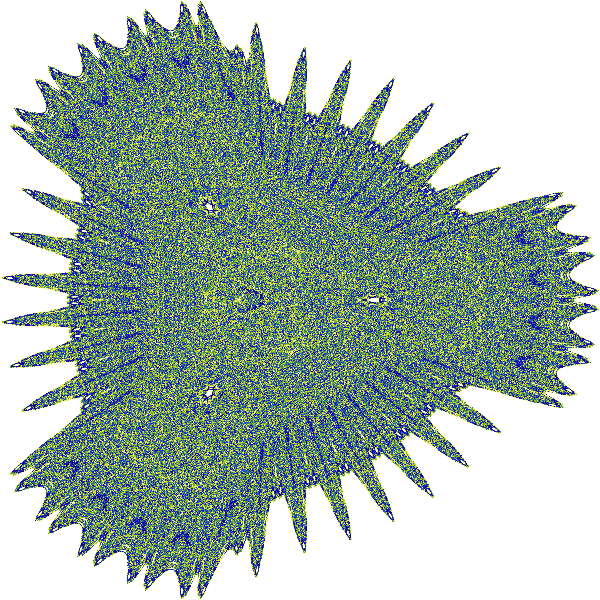
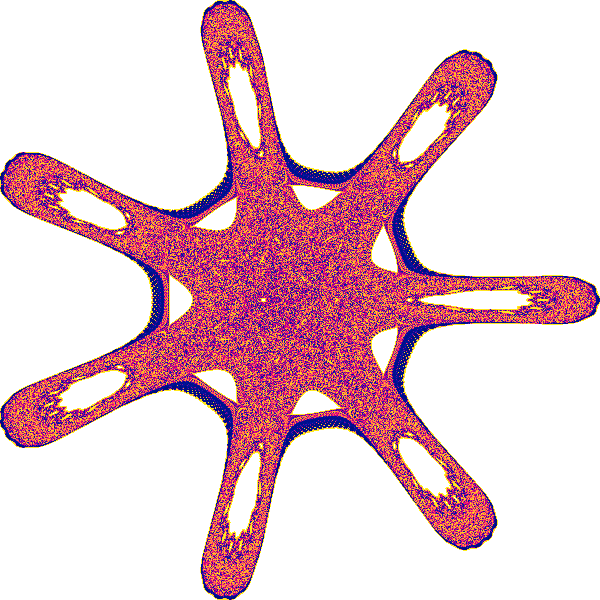
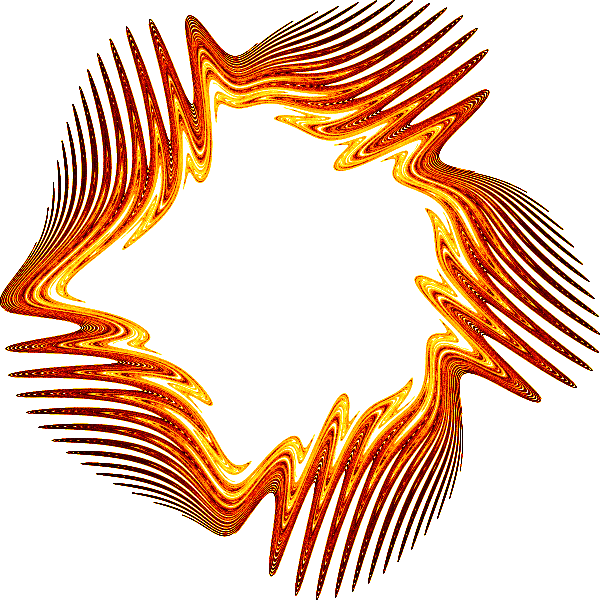
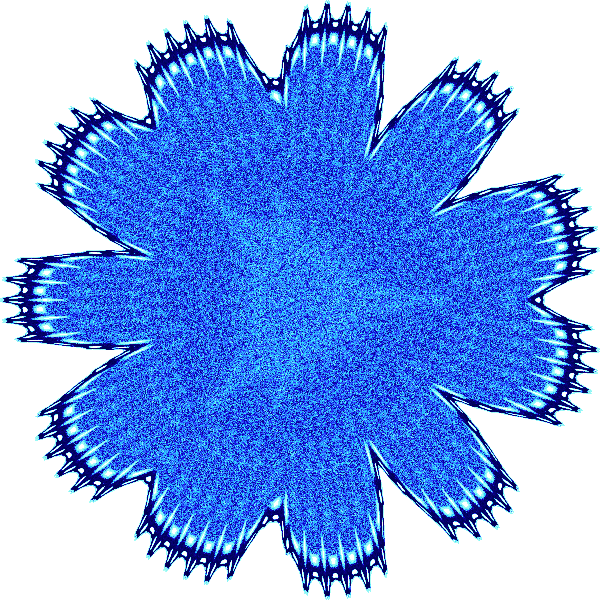

In [44]:
tf.Images(*gmSet3).cols(5)

In [42]:
for indx in range(len(gmSet3)):
    img_map(tf.dynspread(gmSet3[indx]), "gmSet3t2_u%s"%indx)

### Packages, version control

In [36]:
print(f"Python version: {sys.version}")
print(" ")
print("numpy == ", np.__version__)
print("pandas == ", pd.__version__)
print("datashader == ", ds.__version__)
print("numba == ", numba.__version__)

Python version: 3.6.4 |Anaconda custom (64-bit)| (default, Jan 16 2018, 12:04:33) 
[GCC 4.2.1 Compatible Clang 4.0.1 (tags/RELEASE_401/final)]
 
numpy ==  1.14.0
pandas ==  0.22.0
datashader ==  0.6.5
numba ==  0.36.2
